In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline
import statsmodels.formula.api as smf
import statsmodels.api as sm
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
from sklearn.linear_model import LogisticRegression as LR
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [5]:
data = pd.read_csv('data/Boston.csv').drop(columns='Unnamed: 0')
data['c_result'] = [1 if x >= data['crim'].median() else 0 for x in data['crim']]
data.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv,c_result
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0,0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6,0
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7,0
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4,0
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2,0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   crim      506 non-null    float64
 1   zn        506 non-null    float64
 2   indus     506 non-null    float64
 3   chas      506 non-null    int64  
 4   nox       506 non-null    float64
 5   rm        506 non-null    float64
 6   age       506 non-null    float64
 7   dis       506 non-null    float64
 8   rad       506 non-null    int64  
 9   tax       506 non-null    int64  
 10  ptratio   506 non-null    float64
 11  black     506 non-null    float64
 12  lstat     506 non-null    float64
 13  medv      506 non-null    float64
 14  c_result  506 non-null    int64  
dtypes: float64(11), int64(4)
memory usage: 59.4 KB


<Figure size 864x864 with 0 Axes>

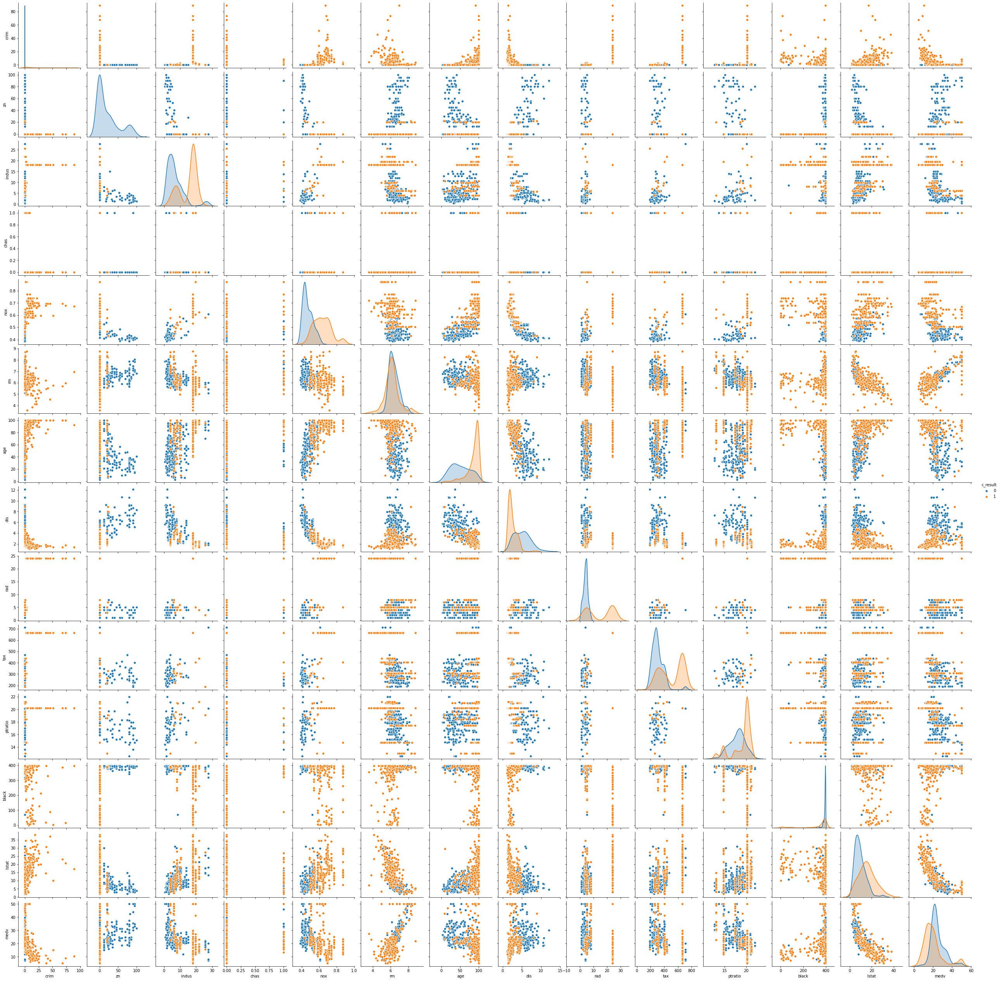

In [7]:
plt.figure(figsize=(12,12))
sb.pairplot(data=data, hue='c_result');

In [10]:
predictors_all = data.columns.drop(['crim', 'c_result'])
logis_regr = smf.glm(formula='c_result ~ ' + ' + '.join(predictors_all), data=data, family=sm.families.Binomial()).fit()
print(logis_regr.summary())
print(logis_regr.pvalues[logis_regr.pvalues < 0.05])

                 Generalized Linear Model Regression Results                  
Dep. Variable:               c_result   No. Observations:                  506
Model:                            GLM   Df Residuals:                      492
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -105.96
Date:                Fri, 09 Oct 2020   Deviance:                       211.93
Time:                        01:02:09   Pearson chi2:                     556.
No. Iterations:                     9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -34.1037      6.530     -5.223      0.0

In [13]:
data.corr()[['crim','c_result']]

,crim,c_result
crim,1.000000,0.409395
zn,-0.200469,-0.436151
indus,0.406583,0.603260
chas,-0.055892,0.070097
nox,0.420972,0.723235
rm,-0.219247,-0.156372
age,0.352734,0.613940
dis,-0.379670,-0.616342
rad,0.625505,0.619786
tax,0.582764,0.608741


In [14]:
# Choose 2 pair to fit model (nox, dis), (age, dis)

In [22]:
predictors_1 = ['nox', 'dis']
predictors_2 = ['age', 'dis']
X_train, X_test, y_train, y_test = train_test_split(data[predictors_1], data['c_result'], test_size=0.3, random_state=1)

In [62]:
# Write function to create quick result to compare between each method
def result(func, X_test, y_test):
    f_pred = func.predict(X_test)
    print('Test accuracy: %.3f' %np.mean(f_pred==y_test))
    print('Test error: %.3f' %(1-np.mean(f_pred==y_test)))
    print('======================================================')
    print(pd.DataFrame(confusion_matrix(y_test, f_pred), [0,1], ['Pred 0', 'Pred 1']))
    print('======================================================')
    print(classification_report(y_test, f_pred))

In [86]:
# Write function to visualize result
def display_result(func, X_test, y_test):
    # plt.figure(figsize=(12,10))
    sb.scatterplot(data=X_test, x=X_test.columns[0], y=X_test.columns[1], hue=y_test, s=80)
    # Create Grid X, Y, Z
    x_min, x_max = plt.xlim()
    y_min, y_max = plt.ylim()
    X = np.linspace(x_min, x_max, 120)
    Y = np.linspace(y_min, y_max, 120)
    X, Y = np.meshgrid(X, Y)
    Z = func.predict(np.c_[X.ravel(), Y.ravel()]).reshape(X.shape)
    # LDA area and boundary
    plt.contourf(X, Y, Z, alpha=0.1)
    plt.contour(X, Y, Z, linewidth=0.3, color='k')
    f_pred = func.predict(X_test)
    plt.text(0.8, 8, 'Test accuracy: %.3f' %np.mean(f_pred==y_test))

In [29]:
# LDA perform
lda = LDA().fit(X_train, y_train)
result(lda, X_test, y_test)

Test accuracy: 0.809
Test error: 0.191
   Pred 0  Pred 1
0      65      10
1      19      58
              precision    recall  f1-score   support

           0       0.77      0.87      0.82        75
           1       0.85      0.75      0.80        77

    accuracy                           0.81       152
   macro avg       0.81      0.81      0.81       152
weighted avg       0.81      0.81      0.81       152



In [31]:
# Logistic Regression perform
lr = LR().fit(X_train, y_train)
result(lr, X_test, y_test)

Test accuracy: 0.757
Test error: 0.243
   Pred 0  Pred 1
0      53      22
1      15      62
              precision    recall  f1-score   support

           0       0.78      0.71      0.74        75
           1       0.74      0.81      0.77        77

    accuracy                           0.76       152
   macro avg       0.76      0.76      0.76       152
weighted avg       0.76      0.76      0.76       152



In [32]:
# QDA perform
qda = QDA().fit(X_train, y_train)
result(qda, X_test, y_test)

Test accuracy: 0.822
Test error: 0.178
   Pred 0  Pred 1
0      64      11
1      16      61
              precision    recall  f1-score   support

           0       0.80      0.85      0.83        75
           1       0.85      0.79      0.82        77

    accuracy                           0.82       152
   macro avg       0.82      0.82      0.82       152
weighted avg       0.82      0.82      0.82       152



In [58]:
# KNN perform
knn = KNeighborsClassifier(n_neighbors=1).fit(X_train, y_train)
result(knn, X_test, y_test)

Test accuracy: 0.829
Test error: 0.171
   Pred 0  Pred 1
0      67       8
1      18      59
              precision    recall  f1-score   support

           0       0.79      0.89      0.84        75
           1       0.88      0.77      0.82        77

    accuracy                           0.83       152
   macro avg       0.83      0.83      0.83       152
weighted avg       0.84      0.83      0.83       152



In [57]:
result_knn = pd.DataFrame(columns=['k', 'Accuracy'])
for i in range(1,16):
    knn = KNeighborsClassifier(n_neighbors=i).fit(X_train, y_train)
    knn_pred = knn.predict(X_test)
    result_knn = result_knn.append({'k':i, 'Accuracy': np.mean(knn_pred==y_test)},ignore_index=True)
result_knn

,k,Accuracy
0,1.0,0.828947
1,2.0,0.809211
2,3.0,0.822368
3,4.0,0.809211
4,5.0,0.835526
5,6.0,0.815789
6,7.0,0.822368
7,8.0,0.809211
8,9.0,0.802632
9,10.0,0.789474


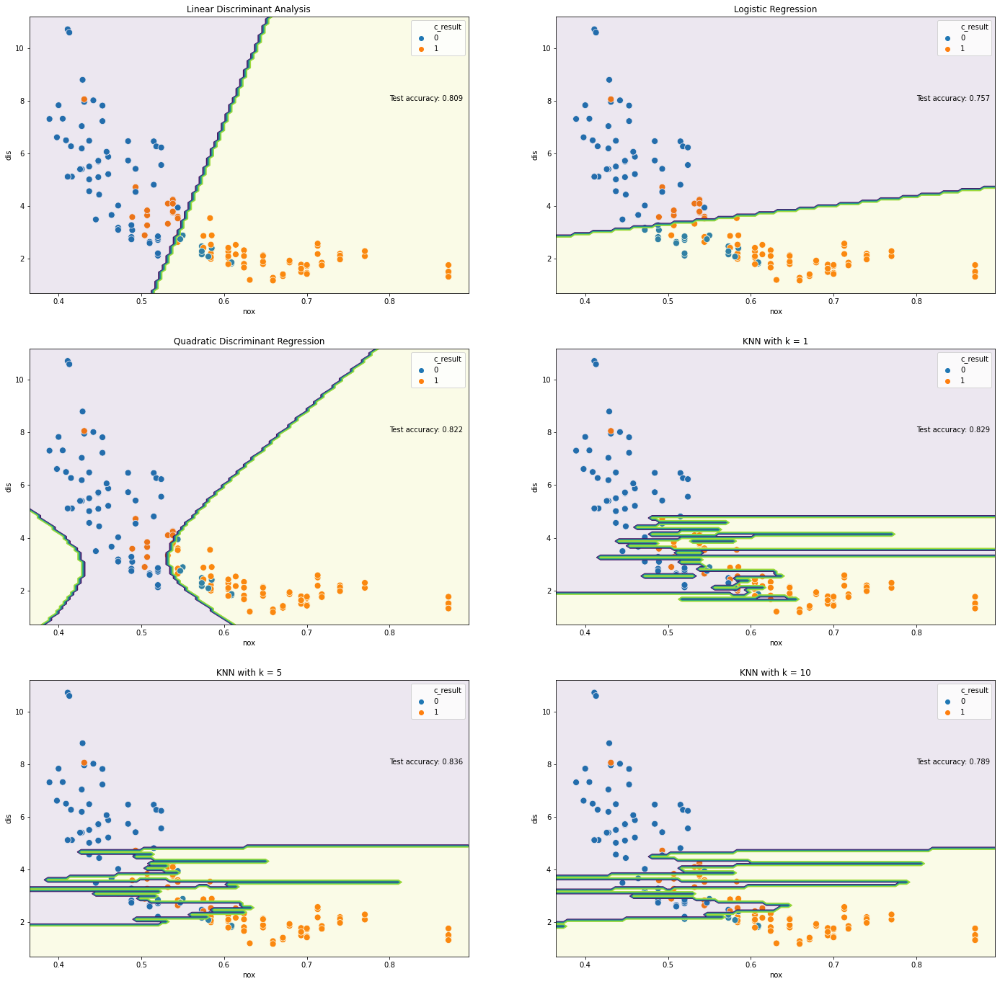

In [87]:
# Visualize
plt.figure(figsize=(24,24))

plot_1 = plt.subplot(3, 2, 1)
display_result(lda, X_test, y_test)
plot_1.set_title('Linear Discriminant Analysis')

plot_2 = plt.subplot(3, 2, 2)
display_result(lr, X_test, y_test)
plot_2.set_title('Logistic Regression')

plot_3 = plt.subplot(3, 2, 3)
display_result(qda, X_test, y_test)
plot_3.set_title('Quadratic Discriminant Regression')

plot_4 = plt.subplot(3, 2, 4)
knn_1 = KNeighborsClassifier(n_neighbors=1).fit(X_train, y_train)
display_result(knn_1, X_test, y_test)
plot_4.set_title('KNN with k = 1')

plot_5 = plt.subplot(3, 2, 5)
knn_5 = KNeighborsClassifier(n_neighbors=5).fit(X_train, y_train)
display_result(knn_5, X_test, y_test)
plot_5.set_title('KNN with k = 5')

plot_6 = plt.subplot(3, 2, 6)
knn_10 = KNeighborsClassifier(n_neighbors=10).fit(X_train, y_train)
display_result(knn_10, X_test, y_test)
plot_6.set_title('KNN with k = 10')

plt.show()